In [1]:
import pandas as pd
from bifacial_peak_shaving import *
from utils import *
pd.options.plotting.backend='plotly'

# Data

In [2]:
dir = './Data/'

## Load

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 8760 entries, 2022-01-01 00:00:00 to 2022-12-31 23:00:00
Freq: H
Data columns (total 1 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Load (kW)  8760 non-null   float64
dtypes: float64(1)
memory usage: 136.9 KB
None
                     Load (kW)
2022-01-01 00:00:00     4.3575
2022-01-01 01:00:00     4.1600
2022-01-01 02:00:00     3.9900
2022-01-01 03:00:00     3.8775
2022-01-01 04:00:00     3.7850
...                        ...
2022-12-31 19:00:00     4.5775
2022-12-31 20:00:00     4.6700
2022-12-31 21:00:00     4.8125
2022-12-31 22:00:00     4.8925
2022-12-31 23:00:00     4.7200

[8760 rows x 1 columns]


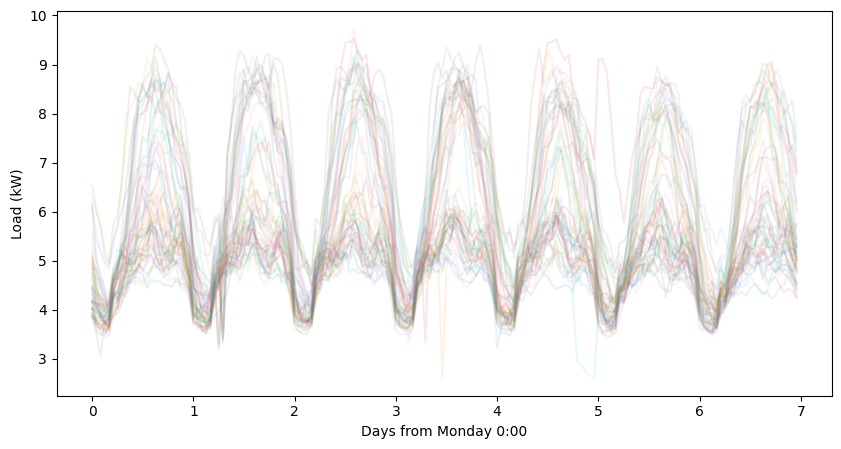

In [3]:
load = pd.read_csv( dir+'verizon_west_excelsior_profile_load_solarTMY_TS2.csv',
                    comment='#',
                    index_col=0,
                    parse_dates=True,
                    usecols=[0,1])
load = load.resample('1h').mean()
load.columns = ['Load (kW)']
load.loc['2022-3-13'] = load.loc['2022-3-12'].values
load.loc['2022-6-22'] = load.loc['2022-6-20'].values
load.loc['2022-6-23'] = load.loc['2022-6-21'].values
load.loc['2022-8-25'] = load.loc['2022-8-23'].values
load.loc['2022-8-26'] = load.loc['2022-8-24'].values

print(load.info())
print(load)
plot_weekly(load['Load (kW)'],interval_min=60)

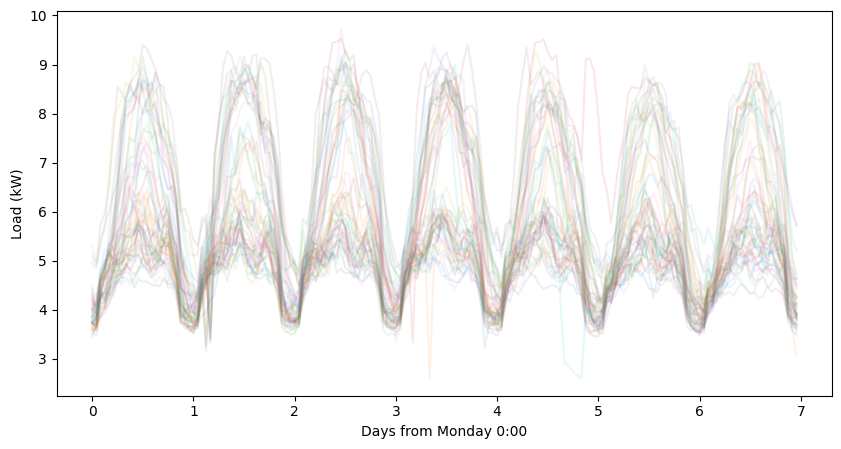

In [4]:
load['Load (kW)'] = shift_and_wraparound(load['Load (kW)'],3)
plot_weekly(load['Load (kW)'],interval_min=60)

In [5]:
load.plot()

## Solar

- 7 kWp, TMY

- Net zero capacity

  - $capacity[kWp] = production[kWh] \times yield [\frac{kWh}{kWp}]^{-1}$

In [6]:
solar_angles = ['s20','w20','w90','s20w90']
solar = pd.concat(( 
                    pd.read_csv(dir+'Solar/Modelled/lemooreCA_7kwp_s20deg.csv',index_col=0),
                    pd.read_csv(dir+'Solar/Modelled/lemooreCA_7kwp_w20deg.csv',index_col=0),
                    pd.read_csv(dir+'Solar/Modelled/lemooreCA_7kwp_w90deg.csv',index_col=0),
                    pd.read_csv(dir+'Solar/Modelled/lemooreCA_3.5kwp_s20deg_3.5kwp_w90deg.csv',index_col=0),
                   ),
                  axis=1)
solar.index = pd.date_range('1900-1-1 0:00',periods=8760,freq='1h')
solar.columns = solar_angles
net_zero_capacity = load['Load (kW)'].sum() / (solar.s20.sum()/7) # load=production / yield
solar = solar * net_zero_capacity/7 # scale to net 0
#solar = solar * 2 # randomly scale up
solar.describe()

,s20,w20,w90,s20w90
count,8760.000000,8760.000000,8760.000000,8760.000000
mean,5.491948,4.909449,5.252362,5.376614
std,7.754001,6.929184,6.904669,6.847427
min,-0.019107,-0.019107,-0.017413,-0.015981
25%,-0.002260,-0.002260,-0.002260,-0.002260
50%,-0.002260,-0.002260,-0.002260,-0.002260
75%,10.859113,9.624747,10.116065,11.588950
max,31.334531,30.188305,26.455404,24.345182


In [7]:
# for col in solar:
#     plot_daily(solar[col],title=col,interval_min=60)

## Plot weekly

In [8]:
solar.index = load.index
df = pd.concat((load,solar),axis=1)
df.columns = ['load'] + ['solar_'+x for x in solar.columns]
for angle in solar.columns:
    df[f'netload_{angle}'] = df['load'] - solar[angle]
df    

,load,solar_s20,solar_w20,solar_w90,solar_s20w90,netload_s20,netload_w20,netload_w90,netload_s20w90
2022-01-01 00:00:00,3.8775,-0.00226,-0.00226,-0.00226,-0.00226,3.87976,3.87976,3.87976,3.87976
2022-01-01 01:00:00,3.7850,-0.00226,-0.00226,-0.00226,-0.00226,3.78726,3.78726,3.78726,3.78726
2022-01-01 02:00:00,4.3125,-0.00226,-0.00226,-0.00226,-0.00226,4.31476,4.31476,4.31476,4.31476
2022-01-01 03:00:00,4.1700,-0.00226,-0.00226,-0.00226,-0.00226,4.17226,4.17226,4.17226,4.17226
2022-01-01 04:00:00,4.2125,-0.00226,-0.00226,-0.00226,-0.00226,4.21476,4.21476,4.21476,4.21476
...,...,...,...,...,...,...,...,...,...
2022-12-31 19:00:00,4.8925,-0.00226,-0.00226,-0.00226,-0.00226,4.89476,4.89476,4.89476,4.89476
2022-12-31 20:00:00,4.7200,-0.00226,-0.00226,-0.00226,-0.00226,4.72226,4.72226,4.72226,4.72226
2022-12-31 21:00:00,4.3575,-0.00226,-0.00226,-0.00226,-0.00226,4.35976,4.35976,4.35976,4.35976
2022-12-31 22:00:00,4.1600,-0.00226,-0.00226,-0.00226,-0.00226,4.16226,4.16226,4.16226,4.16226


load v s20

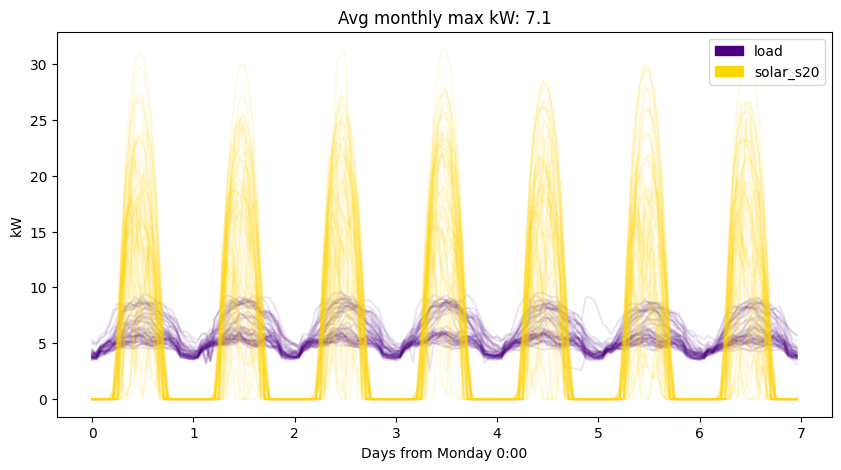

In [9]:
l = df['load']
s = df['solar_s20']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

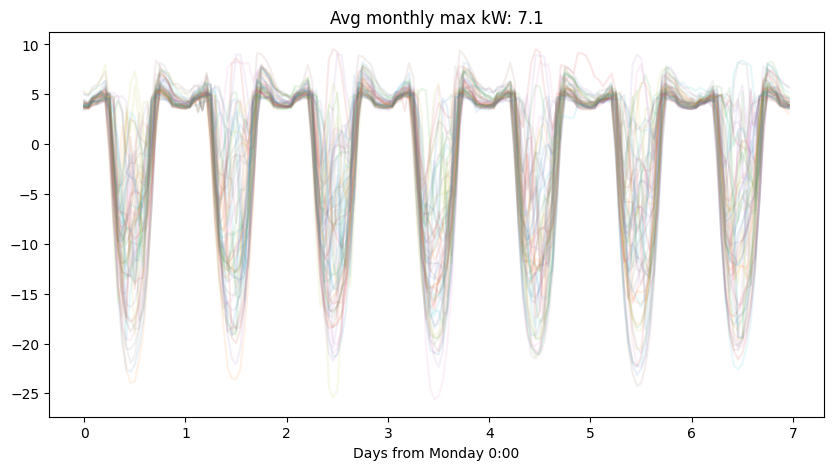

In [10]:
l = df['load']
s = df['solar_s20']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

load v w20

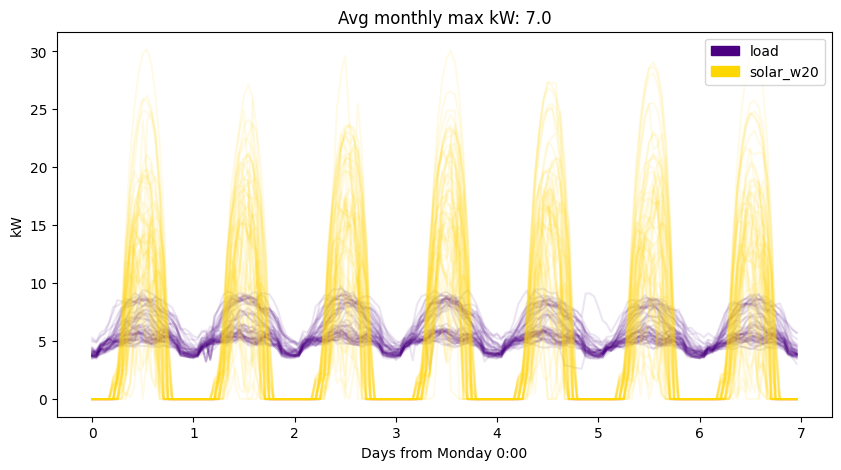

In [11]:
l = df['load']
s = df['solar_w20']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

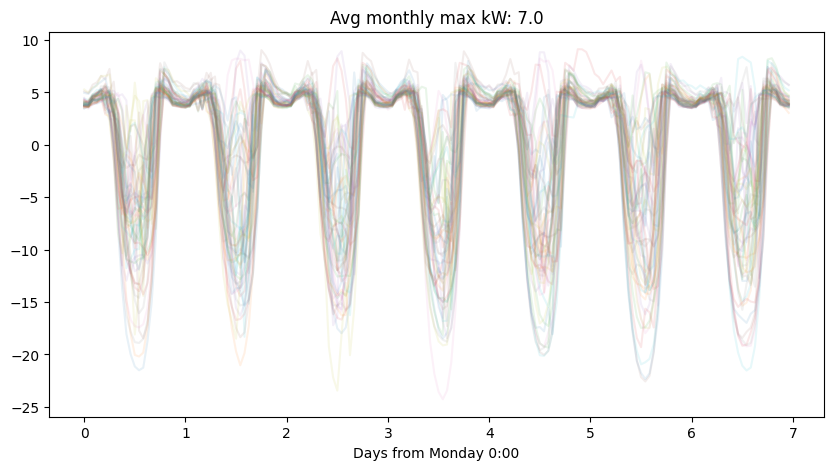

In [12]:
l = df['load']
s = df['solar_w20']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

load v w90

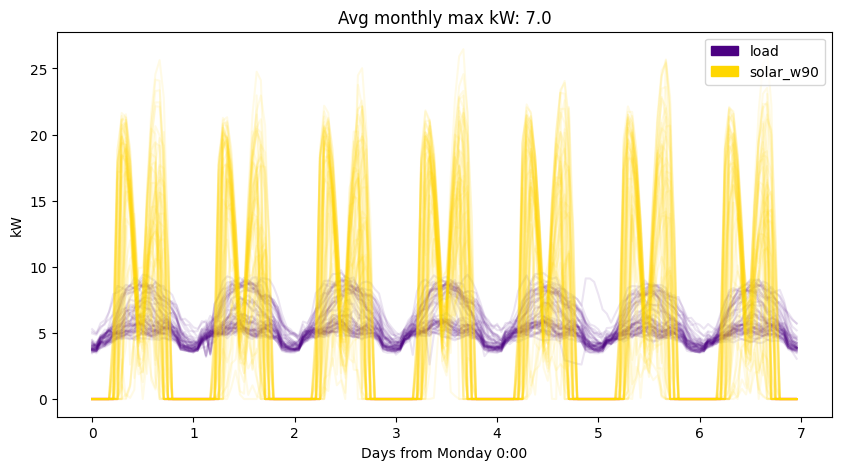

In [13]:
l = df['load']
s = df['solar_w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

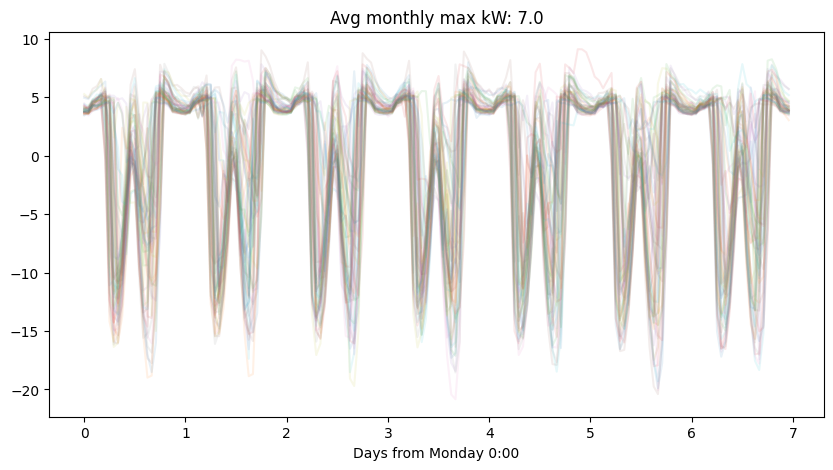

In [14]:
l = df['load']
s = df['solar_w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

load v s20w90

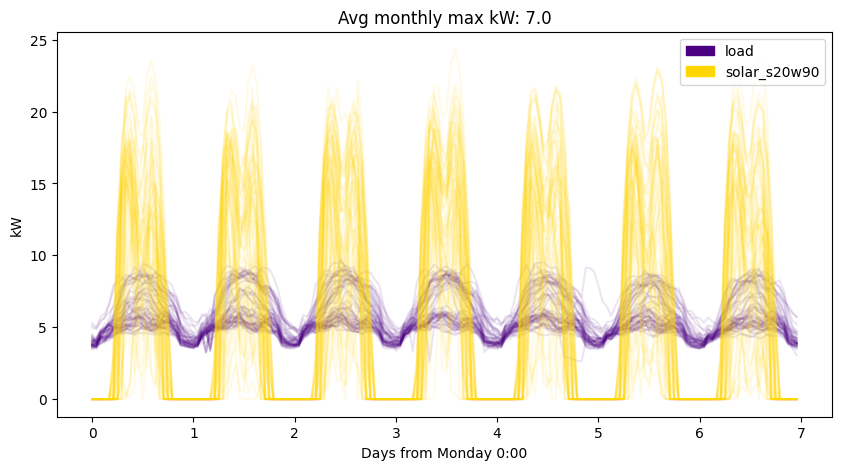

In [15]:
l = df['load']
s = df['solar_s20w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

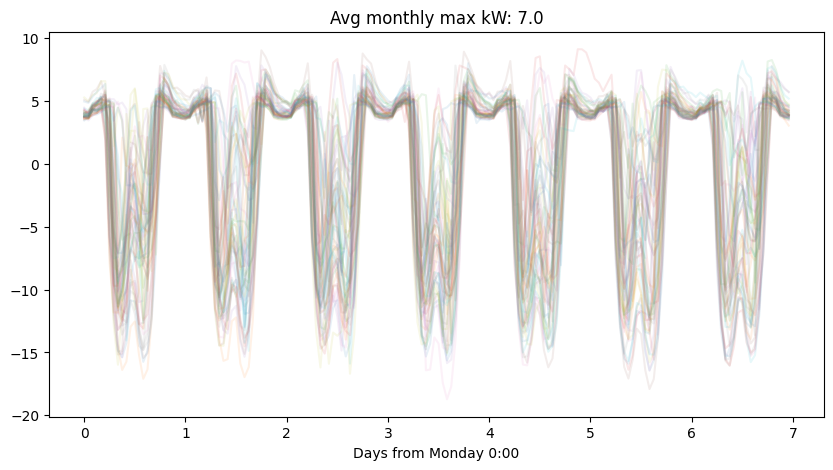

In [16]:
l = df['load']
s = df['solar_s20w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

# Monthly peaks

## Single TOU

In [17]:
peak_begin,peak_end = 8,11
angle = 's20'
peaks = calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)

angle = 'w20'
peaks = pd.concat((peaks,calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)),axis=1)
peaks[f'netload_s20->{angle} reduc kw'] = peaks['netload_s20 kw'] - peaks[f'netload_{angle} kw']

angle = 'w90'
peaks = pd.concat((peaks,calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)),axis=1)
peaks[f'netload_s20->{angle} reduc kw'] = peaks['netload_s20 kw'] - peaks[f'netload_{angle} kw']

angle = 's20w90'
peaks = pd.concat((peaks,calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)),axis=1)
peaks[f'netload_s20->{angle} reduc kw'] = peaks['netload_s20 kw'] - peaks[f'netload_{angle} kw']

print('Avg w20 reduction',peaks['netload_s20->w20 reduc kw'].mean())
print('Avg w90 reduction',peaks['netload_s20->w90 reduc kw'].mean())
print('Avg s20w90 reduction',peaks['netload_s20->s20w90 reduc kw'].mean())
peaks

Avg w20 reduction 0.7166666666666667
Avg w90 reduction 1.3083333333333333
Avg s20w90 reduction 0.85


,netload_s20 kw,netload_s20 t,netload_w20 kw,netload_w20 t,netload_s20->w20 reduc kw,netload_w90 kw,netload_w90 t,netload_s20->w90 reduc kw,netload_s20w90 kw,netload_s20w90 t,netload_s20->s20w90 reduc kw
1,5.5,2022-01-20 08:00:00,5.5,2022-01-20 08:00:00,0.0,5.5,2022-01-20 08:00:00,0.0,5.5,2022-01-20 08:00:00,0.0
2,5.7,2022-02-08 08:00:00,5.7,2022-02-08 08:00:00,0.0,5.9,2022-02-08 08:00:00,-0.2,5.8,2022-02-08 08:00:00,-0.1
3,3.3,2022-03-09 08:00:00,3.3,2022-03-09 08:00:00,0.0,3.8,2022-03-09 08:00:00,-0.5,3.6,2022-03-09 08:00:00,-0.3
4,4.5,2022-04-17 08:00:00,4.5,2022-04-17 08:00:00,0.0,4.7,2022-04-17 08:00:00,-0.2,4.6,2022-04-17 08:00:00,-0.1
5,3.2,2022-05-17 08:00:00,3.2,2022-05-17 08:00:00,0.0,3.8,2022-05-17 08:00:00,-0.6,3.5,2022-05-17 08:00:00,-0.3
6,-0.2,2022-06-27 10:00:00,0.4,2022-06-28 08:00:00,-0.6,1.2,2022-06-28 10:00:00,-1.4,-0.1,2022-06-28 10:00:00,-0.1
7,7.7,2022-07-05 10:00:00,6.6,2022-07-05 10:00:00,1.1,1.3,2022-07-23 09:00:00,6.4,4.4,2022-07-05 10:00:00,3.3
8,8.5,2022-08-24 10:00:00,5.0,2022-08-26 10:00:00,3.5,4.5,2022-08-21 09:00:00,4.0,4.9,2022-08-26 10:00:00,3.6
9,8.0,2022-09-03 10:00:00,3.4,2022-09-03 10:00:00,4.6,-0.4,2022-09-25 10:00:00,8.4,3.6,2022-09-03 10:00:00,4.4
10,5.6,2022-10-30 09:00:00,5.6,2022-10-30 09:00:00,0.0,5.6,2022-10-30 09:00:00,0.0,5.6,2022-10-30 09:00:00,0.0


## Variable TOU

w20

In [18]:
angle1 = 's20'
angle2 = 'w20'

peak_reduc_v_TOU = net_load_peak_reduction_variable_TOU(df,angle1,angle2)
peak_reduc_v_TOU[peak_reduc_v_TOU['avg peak reduction [kW]']>0.2]

,TOU begin [h],TOU end [h],max peak reduction [kW],avg peak reduction [kW],min peak reduction [kW]
1,8,11,4.6,0.7,-0.6
2,8,12,2.0,0.4,0.0
9,8,19,2.2,0.3,0.0
12,9,11,4.6,0.8,-0.2
13,9,12,2.0,0.4,-0.2
20,9,19,2.2,0.3,0.0
23,10,12,2.8,0.6,-0.2
24,10,13,2.8,0.4,-0.1
30,10,19,2.2,0.3,0.0
33,11,13,2.8,0.4,-0.1


w90

In [19]:
angle1 = 's20'
angle2 = 'w90'

peak_reduc_v_TOU = net_load_peak_reduction_variable_TOU(df,angle1,angle2)
peak_reduc_v_TOU[peak_reduc_v_TOU['avg peak reduction [kW]']>0.2]

,TOU begin [h],TOU end [h],max peak reduction [kW],avg peak reduction [kW],min peak reduction [kW]
0,8,10,6.0,0.7,-0.6
1,8,11,8.4,1.3,-1.4
8,8,18,3.0,0.3,-0.9
12,9,11,8.4,1.2,-1.4
19,9,18,3.0,0.3,-0.9
29,10,18,3.0,0.3,-0.9
38,11,18,3.0,0.3,-0.9
46,12,18,3.1,0.3,-0.9
50,13,15,3.5,0.3,-0.9
51,13,16,3.5,0.4,-0.6


s20w90

In [20]:
angle1 = 's20'
angle2 = 's20w90'

peak_reduc_v_TOU = net_load_peak_reduction_variable_TOU(df,angle1,angle2)
peak_reduc_v_TOU[peak_reduc_v_TOU['avg peak reduction [kW]']>0.2]

,TOU begin [h],TOU end [h],max peak reduction [kW],avg peak reduction [kW],min peak reduction [kW]
0,8,10,4.0,0.6,-0.3
1,8,11,4.4,0.8,-0.3
8,8,18,1.8,0.3,-0.2
9,8,19,2.3,0.3,-0.1
12,9,11,4.4,0.8,-0.5
19,9,18,1.8,0.3,-0.2
20,9,19,2.3,0.3,0.0
29,10,18,1.8,0.3,-0.2
30,10,19,2.3,0.3,0.0
38,11,18,1.8,0.3,-0.2


Best for w90

In [21]:
#df.loc['2022-6-28':'2022-6-30'][['load','solar_s20','solar_w90','solar_s20w90']].plot()

In [22]:
#df.loc['2022-3-5':'2022-3-7'][['load','solar_s20','solar_w90','solar_s20w90']].plot()

Largest spread w90 v s20w90

In [23]:
#df.loc['2022-10-12':'2022-10-14'][['load','solar_s20','solar_w90','solar_s20w90']].plot()

# Peak shaving

## Technical

More or less technical peak shaving doesn't benefit from bifacial, I think because if you're trying to shave the entire day you benefit more from the greater kWh produced by s20 than any of the other angles.

### Single angle

In [24]:
angle = 's20'
threshold = 6
batt_kwh_max = 50
tou_h = list(range(24))

batt_kwh,dispatch = find_smallest_soe0(df,f'netload_{angle}',threshold,batt_kwh_max,tou_h,)

plotly_stacked(dispatch,
               solar=f'solar_{angle}',
               title=f'Treshold kW = {threshold}, TOU = {tou_h[0]}-{tou_h[-1]}, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')

Solution found: netload_s20, Threshold kw = 6.0, Battery kWh = 24.0,


### Several angles

In [25]:
threshold = 6
batt_kwh_max = 70
TOU_hours = list(range(24))

results = pd.DataFrame([],columns=['batt_kwh','dispatch'],index=solar_angles)
for angle in solar_angles:
    df2 = df.copy(deep=True)
    batt_kwh,dispatch = find_smallest_soe0(df,
                                            f'netload_{angle}',
                                            threshold,
                                            batt_kwh_max,
                                            TOU_hours)
    results.loc[angle,:] = [batt_kwh,dispatch]
results

Solution found: netload_s20, Threshold kw = 6.0, Battery kWh = 24.0,
Solution found: netload_w20, Threshold kw = 6.0, Battery kWh = 21.0,
Solution found: netload_w90, Threshold kw = 6.0, Battery kWh = 21.0,
Solution found: netload_s20w90, Threshold kw = 6.0, Battery kWh = 21.0,


,batt_kwh,dispatch
s20,24,load solar_s20 solar_...
w20,21,load solar_s20 solar_...
w90,21,load solar_s20 solar_...
s20w90,21,load solar_s20 solar_...


s20

In [26]:
angle = 's20'

batt_kwh = results.batt_kwh[angle]
dispatch = results.dispatch[angle]
plotly_stacked(dispatch,#.loc['2022-8-25':'2022-8-27'],
               solar='solar_'+angle,
               title=f'Threshold kW = {threshold}, Peak TOU = {TOU_hours[0]}:00-{1+TOU_hours[-1]}:00, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')

w90

In [27]:
angle = 'w90'

batt_kwh = results.batt_kwh[angle]
dispatch = results.dispatch[angle]
plotly_stacked(dispatch,#.loc['2022-8-25':'2022-8-27'],
               solar='solar_'+angle,
               title=f'Threshold kW = {threshold}, Peak TOU = {TOU_hours[0]}:00-{1+TOU_hours[-1]}:00, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')

## Economic

### Single angle

In [29]:
threshold = 0
batt_kwh_max = 500
angle = 's20'
tou_h = list(range(16,21))

batt_kwh,dispatch = find_smallest_soe0(df,f'netload_{angle}',threshold,batt_kwh_max,tou_h,)

plotly_stacked(dispatch,
               solar=f'solar_{angle}',
               title=f'Treshold kW = {threshold}, TOU = {TOU_hours[0]}-{TOU_hours[-1]}, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')

Solution found: netload_s20, Threshold kw = 0.0, Battery kWh = 459.0,


### Several angles

In [30]:
threshold = 0
batt_kwh_max = 500
TOU_hours = list(range(16,21))

results = pd.DataFrame([],columns=['batt_kwh','dispatch'],index=solar_angles)
for angle in solar_angles:
    df2 = df.copy(deep=True)
    batt_kwh,dispatch = find_smallest_soe0(df,
                                            f'netload_{angle}',
                                            threshold,
                                            batt_kwh_max,
                                            TOU_hours)
    results.loc[angle,:] = [batt_kwh,dispatch]
results

Solution found: netload_s20, Threshold kw = 0.0, Battery kWh = 459.0,
Solution found: netload_w20, Threshold kw = 0.0, Battery kWh = 359.0,
Solution found: netload_w90, Threshold kw = 0.0, Battery kWh = 110.0,
Solution found: netload_s20w90, Threshold kw = 0.0, Battery kWh = 141.0,


,batt_kwh,dispatch
s20,459,load solar_s20 solar_...
w20,359,load solar_s20 solar_...
w90,110,load solar_s20 solar_...
s20w90,141,load solar_s20 solar_...


s20

In [30]:
angle = 's20'

batt_kwh = results.batt_kwh[angle]
dispatch = results.dispatch[angle]
plotly_stacked(dispatch,#.loc['2022-8-25':'2022-8-27'],
               solar='solar_'+angle,
               title=f'Threshold kW = {threshold}, Peak TOU = {TOU_hours[0]}:00-{1+TOU_hours[-1]}:00, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')

w90

In [31]:
angle = 'w90'

batt_kwh = results.batt_kwh[angle]
dispatch = results.dispatch[angle]
plotly_stacked(dispatch,#.loc['2022-8-25':'2022-8-27'],
               solar='solar_'+angle,
               title=f'Threshold kW = {threshold}, Peak TOU = {TOU_hours[0]}:00-{1+TOU_hours[-1]}:00, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')